<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW5_boosting_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## **Домашняя работа 5: Бустинг и кластеризация**

### **Постановка задачи:**

В этой работы ваша задача подразделена на части:

*   В первой части вам предстоит реалищовать класс бустинга и сравнить его со встроенными классами популярных библиотек;
*   Во второй части вам предстоит применить алгоритмы кластеризации в задаче  разделения изображения на семантические компоненты;

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**

## **Часть 1: построение класса алгоритма бустинга**

**Количество баллов:** 7

Начнём с нужных библиотек и загрузки данных. Работать будем с датасетом из Kaggle и с синтетическим датасетом.

Данные c Kaggle связаны с телефонной рекламой португальского банковского учреждения. Цель классификации — спрогнозировать, подпишется ли клиент на срочный депозит (переменная y).

Всего в данных 20 признаков, ознакомиться с признаковым описанием можно [здесь](https://www.kaggle.com/code/sachinrajput17/subscription-prediction-for-bank-marketing-data).

Будем действовать из предположений, что датасет достаточно хорош, чтобы мы уже могли построить на нём базовую модель.

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, f1_score, log_loss, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier

In [2]:
!wget  -O 'bank_data.csv' -q 'https://www.dropbox.com/s/uy27mctxo0gbuof/bank_data.csv?dl=0'

In [3]:
df = pd.read_csv('bank_data.csv')
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
552,36,blue-collar,married,basic.9y,no,yes,no,telephone,jun,fri,...,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,1
3836,57,housemaid,married,basic.4y,no,no,no,cellular,aug,wed,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,1
5710,51,management,married,basic.4y,no,yes,no,cellular,jul,thu,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,-1
4487,30,technician,single,professional.course,no,no,no,cellular,jun,thu,...,1,999,0,nonexistent,-2.9,92.963,-40.8,1.260,5076.2,1
1772,28,student,single,high.school,no,no,yes,cellular,may,wed,...,1,3,5,success,-1.8,93.876,-40.0,0.690,5008.7,1


Разделим на train и test (random_state не меняем)

In [4]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

Генерируем синтетические данные (seed не меняем)

In [5]:
np.random.seed(42)

num_obs = 10 ** 5
num_thresholds = 50

X_synthetic = np.random.normal(scale=3, size=[num_obs, 2])
x1_thresholds = np.random.choice(X_synthetic[:, 0], num_thresholds, False)
x2_thresholds = np.random.choice(X_synthetic[:, 1], num_thresholds, False)

gains = np.random.uniform(-0.4086, 0.5, size=[2 * num_thresholds, 1])
x1_thresholds_cond = [X_synthetic[:, 0] >= threshold for threshold in x1_thresholds]
x2_thresholds_cond = [X_synthetic[:, 1] >= threshold for threshold in x2_thresholds]

noise = np.random.uniform(-0.5, 0.5, size=num_obs)

y_synthetic_probits = np.sum(
    gains[:num_thresholds] * x1_thresholds_cond + gains[num_thresholds:] * x2_thresholds_cond, axis=0
) + noise
y_synthetic = np.sign(y_synthetic_probits)

X_train_synthetic, y_train_synthetic = X_synthetic[:int(num_obs * 0.8)], y_synthetic[:int(num_obs * 0.8)]
X_test_synthetic, y_test_synthetic = X_synthetic[int(num_obs * 0.8):], y_synthetic[int(num_obs * 0.8):]

px.histogram(x = y_synthetic_probits, nbins=100)

Некоторый полезный код для визуализации предсказаний (пригодится позже)

In [6]:
import matplotlib.pyplot as plt

def plot_predicts(model, features, targets, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='', mode='classification'):
    '''
    Функция для визуализации предсказаний модели на двухмерной плоскости
    param model: обученная модель классификации или регрессии для двухмерных объектов
    param features: признаки выборки (a.k.a. X)
    param targets: целевая переменная выборки (a.k.a y)
    param x_lim: пределы для x
    param y_lim: пределы для y
    param examples_density: доля выборки, которая будет нарисована
    param steps: частота разбиения плоскости
    param num_ticks: число подписей на графике
    param title: заголовок графика
    param mode: режим 'classification' - вероятности положительного класса
                режим 'regression' - вещественная целевая переменная
    '''

    mask = np.random.choice([True, False], size=features.shape[0],
                            p=[examples_density, 1.0 - examples_density])
    features_x = (features[mask, 0] - x_lim[0]) / (x_lim[1] - x_lim[0]) * steps
    features_y = (features[mask, 1] - y_lim[0]) / (y_lim[1] - y_lim[0]) * steps

    xs = np.linspace(x_lim[0], x_lim[1], steps)
    ys = np.linspace(y_lim[0], y_lim[1], steps)

    xs, ys = np.meshgrid(xs, ys)
    grid = np.stack([xs.flatten(), ys.flatten()], axis=1)
    if mode == 'classification':
        predicts = model.predict_proba(grid)[:, 1].reshape(steps, steps)
        values = (targets[mask] == 1).astype(np.float)
    elif mode == 'regression':
        predicts = model.predict(grid).reshape(steps, steps)
        values = targets[mask]
    else:
        raise ValueError('Unknown mode')

    plt.figure(figsize=(10, 10))
    plt.imshow(predicts, origin='lower')
    plt.scatter(features_x, features_y, c=values, edgecolors='white', linewidths=1.5)
    plt.colorbar()

    plt.xticks(np.linspace(0, steps, num_ticks), np.linspace(x_lim[0], x_lim[1], num_ticks))
    plt.yticks(np.linspace(0, steps, num_ticks), np.linspace(y_lim[0], y_lim[1], num_ticks))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.grid()
    plt.show()

### **Задание 1. (4 балла) Реализуйте бустинг для задачи бинарной классификации**

Реализовывать класс буситнга необходимо согласно его теоретическому описанию. Вы начинаете с параметрами:

- `base_model_class=DecisionTreeRegressor` — базовая модель
- `base_model_params: dict={'max_features': 0.1}` — параметрмы базовой модели, рассчет максимального количества признаков полагаем как: `max(1, int(max_features * n_features_in_))`
- `n_estimators: int=10` — количество моделей
- `learning_rate: float=0.1` — скорость обучения
- `subsample: float=0.3` — доля данных, которая будет использоваться для подбора отдельных алгоритмов.
— `random_seed: int=228` — тут как всегда
– `custom_loss: list or tuple=None` — функция потерь
— `use_best_model: bool=False` — использовать ли при вызове predict и predict_proba лучшее с точки зрения валидационной выборки число деревьев в композиции
— `n_iter_early_stopping: int=None` — ранний критерий остановки

**Примечание:**

Поскольку градиентный бустинг обучается через последовательное создание моделей, может получиться так, что оптимальная с точки зрения генерализации модель будет получена на промежуточной итерации. Обычно для контроля такого поведения в методе `fit` передается также валидационная выборка, по которой можно оценивать общее качество модели в процессе обучения (желательно делать это каждую итерацию, но если ваша имплементация слишком медленная или ваше железо не тянет, можно делать это реже).

**Примечание 2:**

Нет смысла обучать действительно глубокую модель на 1000 деревьев и больше, если оптимальный ансамбль получился, к примеру, на 70 итерации и в течение какого-то количества итераций не улучшился - поэтому мы также задействуем early stopping при отсутствии улучшений в течение некоторого числа итераций.

In [7]:
from sklearn.utils import resample


class Boosting:

    def __init__(
        self,
        base_model_class=DecisionTreeRegressor,
        base_model_params: dict={'max_features': 0.1},
        n_estimators: int=100,
        learning_rate: float=0.1,
        subsample: float=0.3,
        random_seed: int=228,
        custom_loss: list or tuple=None,
        use_best_model: bool=False,
        n_iter_early_stopping: int=None
    ):

        # Класс базовой модели
        self.base_model_class = base_model_class
        # Параметры для инициализации базовой модели
        self.base_model_params = base_model_params
        # Число базовых моделей
        self.n_estimators = n_estimators
        # Длина шага (которая в лекциях обозначалась через eta)
        self.learning_rate = learning_rate
        # Доля объектов, на которых обучается каждая базовая модель
        self.subsample = subsample
        # seed для бутстрапа, если хотим воспроизводимость модели
        self.random_seed = random_seed
        # Использовать ли при вызове predict и predict_proba лучшее
        # с точки зрения валидационной выборки число деревьев в композиции
        self.use_best_model = use_best_model
        # число итераций, после которых при отсутствии улучшений на валидационной выборке обучение завершается
        self.n_iter_early_stopping = n_iter_early_stopping

        # Место для нулевой модели
        self.initial_model_pred = None

        # Список для хранения весов при моделях
        self.gammas = []

        # Создаем список базовых моделей
        self.models = [self.base_model_class(**self.base_model_params) for _ in range(self.n_estimators)]

        # Если используем свою функцию потерь, ее нужно передать как список из loss-a и его производной
        if custom_loss is not None:
            self.loss_fn, self.loss_derivative = custom_loss
        else:
            self.sigmoid = lambda z: 1 / (1 + np.exp(-z))
            self.loss_fn = lambda y, z: -np.log(self.sigmoid(y * z)).mean()
            self.loss_derivative = lambda y, z: -y * self.sigmoid(-y * z)


    def _fit_new_model(self, X: np.ndarray, y: np.ndarray or list, n_model: int):
        """
        Функция для обучения одной базовой модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :param n_model: номер модели, которую хотим обучить
        """

        np.random.seed(self.random_seed + n_model)
        sample_idx = resample(np.arange(X.shape[0]), n_samples=int(self.subsample * X.shape[0]), replace=False)
        X_sample, y_sample = X[sample_idx], y[sample_idx]
        self.models[n_model].fit(X_sample, y_sample)


    def _fit_initial_model(self, X, y):
        """
        Функция для построения нулевой (простой) модели. Не забудьте взять логарифм, потому что сигмоида применяется
        уже к сумме предсказаний базовых моделей, а не к каждому предсказанию каждой модели по отдельности.
        Подойдёт константная модель, возвращающая самый популярный класс,
        но если хотите, можете сделать что-нибудь посложнее.
        """

        self.initial_model_pred = np.log(np.mean(y) / (1 - np.mean(y)))


    def _find_optimal_gamma(self, y: np.ndarray or list, old_predictions: np.ndarray,
                            new_predictions: np.ndarray, boundaries: tuple or list=(0.01, 1)):
        """
        Функция для поиска оптимального значения параметра gamma (коэффициент перед новой базовой моделью).
        :param y: вектор целевой переменной
        :param old_predictions: вектор суммы предсказаний предыдущих моделей (до сигмоиды)
        :param new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
        :param boudnaries: в каком диапазоне искать оптимальное значение ɣ (array-like объект из левой и правой границ)
        """
        # Определеяем начальные лосс и оптимальную гамму
        loss, optimal_gamma = self.loss_fn(y, old_predictions), 0
        # Множество, на котором будем искать оптимальное значение гаммы
        gammas = np.linspace(*boundaries, 100)
        # Простым перебором ищем оптимальное значение
        for gamma in gammas:
            predictions = old_predictions + gamma * new_predictions
            gamma_loss = self.loss_fn(y, predictions)
            if gamma_loss < loss:
                optimal_gamma = gamma
                loss = gamma_loss

        return optimal_gamma


    def fit(self, X, y, eval_set=None):
        """
        Функция для обучения всей модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :eval_set: кортеж (X_val, y_val) для контроля процесса обучения или None, если контроль не используется
        """

        self._fit_initial_model(X, y)
        predictions = np.full_like(y, self.initial_model_pred, dtype=float)
        best_iteration = 0
        best_loss = float('inf')
        self.best_iteration = None
        self.best_loss = None
        no_improvement_count = 0

        for i in range(self.n_estimators):
            residuals = -self.loss_derivative(y, predictions)
            self._fit_new_model(X, residuals, i)
            new_predictions = self.models[i].predict(X)
            gamma = self._find_optimal_gamma(y, predictions, new_predictions)
            self.gammas.append(gamma)  # Добавляем gamma в список
            predictions += self.learning_rate * gamma * new_predictions
            # print('n_models', i)
            # print('self.models', len(self.models))
            # print('self.gammas[i]', len(self.gammas))

            # Проверка на раннюю остановку
            if eval_set is not None:
                X_val, y_val = eval_set
                val_predictions = self.predict(X_val)
                val_loss = self.loss_fn(y_val, val_predictions)
                if val_loss < best_loss:
                    best_loss = val_loss
                    best_iteration = i
                    no_improvement_count = 0
                else:
                    no_improvement_count += 1

                # Остановка, если нет улучшений в течение n_iter_early_stopping итераций
                if self.n_iter_early_stopping is not None and no_improvement_count >= self.n_iter_early_stopping:
                    break

        # # Сохраняем лучшую итерацию, если используется use_best_model
        if self.use_best_model and eval_set is not None:
            self.best_iteration = best_iteration
            self.best_loss = best_loss


    def predict(self, X: np.ndarray):
        """
        Функция для предсказания классов обученной моделью бустинга
        :param X: матрица признаков
        """

        predictions = np.full(X.shape[0], self.initial_model_pred, dtype=float)
        n_models = self.best_iteration + 1 if self.use_best_model and self.best_iteration is not None else min([self.n_estimators, len(self.gammas)])
        for i in range(n_models):
            predictions += self.learning_rate * self.gammas[i] * self.models[i].predict(X)
        return np.sign(predictions)

    def predict_proba(self, X: np.ndarray):
        """
        Функция для предсказания вероятностей классов обученной моделью бустинга
        :param X: матрица признаков
        """

        predictions = np.full(X.shape[0], self.initial_model_pred, dtype=float)
        n_models = self.best_iteration + 1 if self.use_best_model and self.best_iteration is not None else self.n_estimators
        for i in range(n_models):
            predictions += self.learning_rate * self.gammas[i] * self.models[i].predict(X)
        return self.sigmoid(predictions)

    @property
    def feature_importances_(self):
        """
        Функция для вычисления важностей признаков.
        Вычисление должно проводиться после обучения модели
        и быть доступно атрибутом класса.
        """
        importances = np.zeros(self.models[0].n_features_)
        for model in self.models:
            importances += model.feature_importances_
        return importances / len(self.models)


## **Тест для вашей имплементации.**

Если класс написан правильно, две следующие ячейки должна отработать без ошибок и относительно быстро (у автора задания 2 и 0.2 секунд соответственно, accuracy 0.911 и 0.879 соответственно). Если у вас получилось качество выше указанного — отлично!

In [8]:
%%time

boosting = Boosting()
boosting.fit(X_train_synthetic, y_train_synthetic)
# Без разницы, выдает эта строка классы или вероятности

preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.8817
CPU times: user 10.6 s, sys: 137 ms, total: 10.8 s
Wall time: 10.8 s


In [9]:
%%time

boosting = Boosting()
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), preds) > 0.87)

False
CPU times: user 866 ms, sys: 5.18 ms, total: 871 ms
Wall time: 870 ms


### **Задание 2. (1.2 балла) Сравнение с базовыми моделями**

- Сравните результаты вашей имплементации бустинга, где в качестве базовых моделей используйте алгоритмы, перечисленные ниже. Сравнение проводите на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных. Данные берите из реальной задачи (bank_data).
- Ответьте на поставленные вопросы

Варианты для базовой модели (разумеется, не надо их программировать самостоятельно, берите нужные классы из sklearn):

- Решающее дерево глубины 6
- Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)
- Линейная регрессия

In [10]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression

In [11]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

In [12]:
categorical_cols = df_train.select_dtypes(include=['object']).columns
df_train = pd.get_dummies(df_train, columns=categorical_cols, drop_first=True)
df_test  = pd.get_dummies(df_test, columns=categorical_cols, drop_first=True)

X_train = df_train.drop('y', axis=1).astype(float).values
y_train = df_train['y'].values

X_test = df_test.drop('y', axis=1).astype(float).values
y_test = df_test['y'].values

In [13]:
def evaluate_model(model, X_test, y_test):
    predictions = model.predict(X_test)
    proba = model.predict_proba(X_test)
    accuracy = accuracy_score(y_test, np.sign(predictions))
    auc = roc_auc_score(y_test, proba)
    return accuracy, auc

In [14]:
boosting_tree = Boosting(
    base_model_class=DecisionTreeRegressor, 
    base_model_params={'max_depth': 6}, 
    n_estimators=100, 
    learning_rate=0.1, 
    random_seed=42,
    use_best_model=True
)
boosting_tree.fit(X_train, y_train, eval_set=(X_test, y_test))
tree_accuracy, tree_auc = evaluate_model(boosting_tree, X_test, y_test)
print(tree_accuracy, tree_auc)

0.875 0.9525170015851102


In [15]:
boosting_forest = Boosting(
    base_model_class=RandomForestRegressor, 
    base_model_params={'n_estimators': 50, 'max_depth': 6}, 
    n_estimators=100, 
    learning_rate=0.1, 
    random_seed=42,
    use_best_model=True
    )
boosting_forest.fit(X_train, y_train, eval_set=(X_test, y_test))
forest_accuracy, forest_auc = evaluate_model(boosting_forest, X_test, y_test)
print(forest_accuracy, forest_auc)

0.8712284482758621 0.9510266028903857


In [16]:
boosting_linear = Boosting(
    base_model_class=LinearRegression, 
    base_model_params={},
    n_estimators=100, 
    learning_rate=0.1, 
    random_seed=42,
    use_best_model=True
    )
boosting_linear.fit(X_train, y_train, eval_set=(X_test, y_test))
linear_accuracy, linear_auc = evaluate_model(boosting_linear, X_test, y_test)
print(linear_accuracy, linear_auc)

0.7602370689655172 0.9295079185783282


In [17]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
predictions = lr.predict(X_test)
lr_accuracy = accuracy_score(y_test, np.sign(predictions))
print(lr_accuracy)

0.8485991379310345


/home/jovyan/stanishevskiy/envs/mag/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [18]:
results = pd.DataFrame({
    'Base Model': ['DecisionTreeRegressor', 'RandomForestRegressor', 'LinearRegression'],
    'Accuracy': [tree_accuracy, forest_accuracy, linear_accuracy],
    'AUC': [tree_auc, forest_auc, linear_auc]
})

results

,Base Model,Accuracy,AUC
0,DecisionTreeRegressor,0.875000,0.952517
1,RandomForestRegressor,0.871228,0.951027
2,LinearRegression,0.760237,0.929508


In [19]:
results.to_dict(orient='list')

{'Base Model': ['DecisionTreeRegressor',
  'RandomForestRegressor',
  'LinearRegression'],
 'Accuracy': [0.875, 0.8712284482758621, 0.7602370689655172],
 'AUC': [0.9525170015851102, 0.9510266028903857, 0.9295079185783282]}

**Вопросы:**

1) Какая из моделей имеет оптимальное качество? С чем это связано?

2) Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

3) Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

4) Визуализируйте предсказания моделей только на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.

1) Boosting + DecisionTreeRegressor:   
    хорошо описывает не линейные зависимости. Достаточно простой.   
    RandomForestRegressor - уже ансамбль и менее гибкий чем дерево  
    LinearRegression  - хорош для линейных зависимостей. в такой задаче и сам отработает хорошо, бустинг скорее всего будет избыточен  
2) LinearRegression, так как линейная модель не способна адаптироваться к сложным данным, и бустинг пытается компенсировать это увеличением числа итераций, что приводит к переобучению.  
    Преимущества ранней остановки и обрезания бустинга:   
    Ранняя остановка позволяет остановить обучение, если качество на валидационной выборке перестает улучшаться. Это предотвращает переобучение и экономит вычислительные ресурсы.  
    Обрезание бустинга до лучшей модели (использование use_best_model=True) позволяет использовать только те итерации, которые дают наилучшее качество на валидационной выборке, препятствует переобучению.  
3) LinearRegression плохо подходит для классификации, LogisticRegression является линейным классфикитором.  
    Boosting сильный механизм для улучшения гибких моделей, для рассмотрения зависимостейн не линейного характера. Т.к. линейная регрессия хорошо работает с 
    линейными зависимостями, для задач классификации она часто слишком слаба, особенно в ситуации с наличием большого количества категориальных признаков.

In [20]:
boosting_linear = Boosting(
    base_model_class=LinearRegression, 
    base_model_params={},
    n_estimators=100, 
    learning_rate=0.1, 
    random_seed=42,
    use_best_model=True
    )

boosting_forest = Boosting(
    base_model_class=RandomForestRegressor, 
    base_model_params={'n_estimators': 50, 'max_depth': 6}, 
    n_estimators=100, 
    learning_rate=0.1, 
    random_seed=42,
    use_best_model=True
    )

boosting_tree = Boosting(
    base_model_class=DecisionTreeRegressor, 
    base_model_params={'max_depth': 6}, 
    n_estimators=100, 
    learning_rate=0.1, 
    random_seed=42,
    use_best_model=True
)

In [21]:
boosting_linear.fit(X_train_synthetic, y_train_synthetic, eval_set=(X_test_synthetic, y_test_synthetic))
boosting_forest.fit(X_train_synthetic, y_train_synthetic, eval_set=(X_test_synthetic, y_test_synthetic))
boosting_tree.fit(X_train_synthetic, y_train_synthetic, eval_set=(X_test_synthetic, y_test_synthetic))

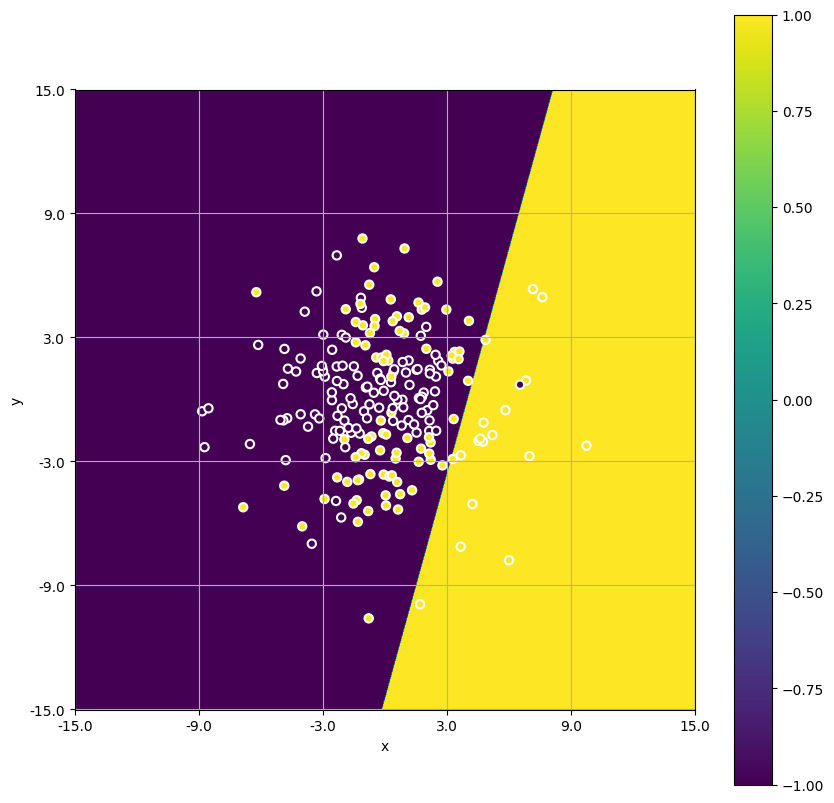

In [22]:
plot_predicts(boosting_linear, X_test_synthetic, y_test_synthetic, mode = 'regression')

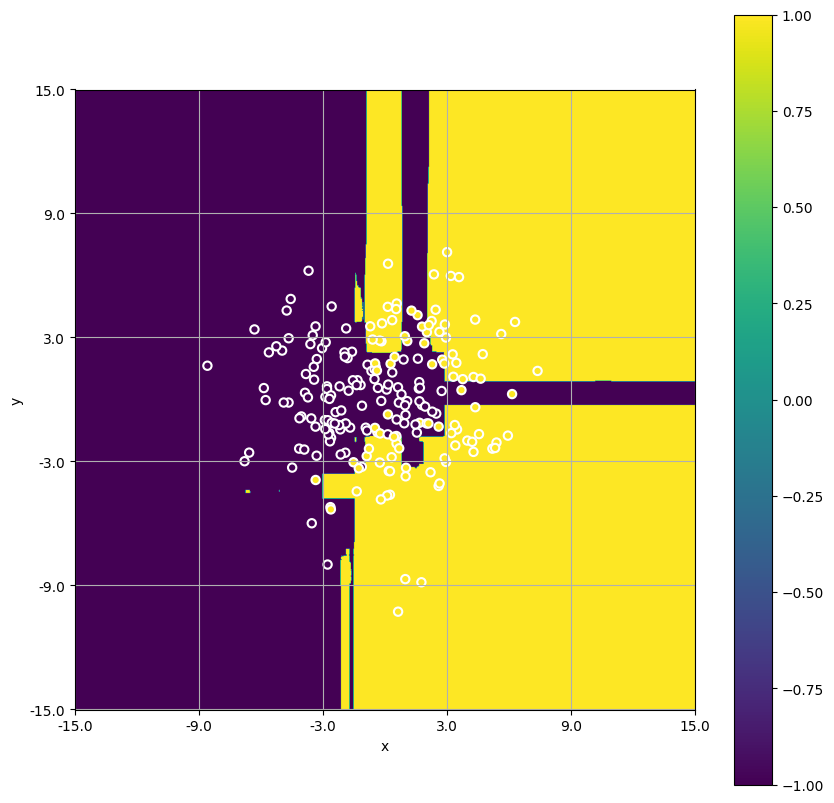

In [23]:
plot_predicts(boosting_forest, X_test_synthetic, y_test_synthetic, mode = 'regression')

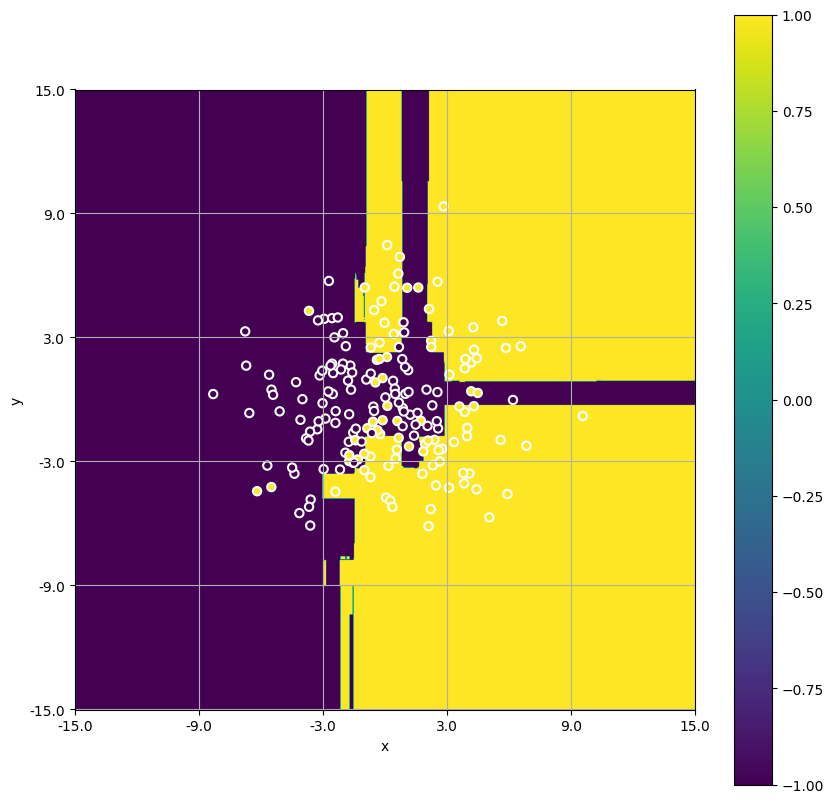

In [24]:
plot_predicts(boosting_tree, X_test_synthetic, y_test_synthetic, mode = 'regression')

Логистическая регрессия, плохо разделяет (не гибкая). Лес и дерево очень похожи

### **Задание 3. (0.8 балла) Сравнение с бустингами**

- Сравните на реальных данных данных любую из трёх популярных имплементаций градиентного бустинга (xgboost, lightgbm, catboost) с вашей реализацией.
- Укажите, получилось ли у вас победить библиотечные реализации на тестовых данных?

**Примечание:**

Подберите основные гиперпараметры (число деревьев, длина шага, глубина дерева/число листьев) для обоих методов.


In [25]:
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier

In [26]:
best_catboost_score = 0.0
for n_estimators in [100, 150, 200, 250]:
    for learning_rate in [0.05, 0.10, 0.15, 0.25]:
        for max_depth in [4, 5, 6, 7, 8]:
            catboost = CatBoostClassifier(
                random_state=42,
                use_best_model=True,
                silent=True
            )
            catboost.fit(X_train, (y_train > 0).astype(int), eval_set=(X_test, (y_test > 0).astype(int)))
            catboost_accuracy = accuracy_score(catboost.predict(X_test), (y_test > 0).astype(int))
            
            if catboost_accuracy > best_catboost_score:
                best_catboost_score = catboost_accuracy
                best_catboost_estimator = catboost
                best_catboost_params = {'learning_rate': learning_rate, 'max_depth': max_depth, 'n_estimators': n_estimators}
print(best_catboost_score, best_catboost_params)

0.8960129310344828 {'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 100}


In [27]:
best_boosting_tree_score = 0.0
for n_estimators in [100, 150, 200, 250]:
    for learning_rate in [0.05, 0.10, 0.15, 0.25]:
        for max_depth in [4, 5, 6, 7, 8]:
            boosting_tree = Boosting(
                base_model_class=DecisionTreeRegressor,
                base_model_params={'max_depth': max_depth},
                n_estimators=n_estimators,
                learning_rate=learning_rate,
                random_seed=42,
                use_best_model=True
            )
            boosting_tree.fit(X_train, y_train, eval_set=(X_test, y_test))
            boosting_tree_accuracy = accuracy_score(np.sign(boosting_tree.predict(X_test)), y_test)
            
            if boosting_tree_accuracy > best_boosting_tree_score:
                best_boosting_tree_score = boosting_tree_accuracy
                best_boosting_tree_estimator = boosting_tree
                best_boosting_tree_params = {'learning_rate': learning_rate, 'max_depth': max_depth, 'n_estimators': n_estimators}

print(best_boosting_tree_score, best_boosting_tree_params)

0.8938577586206896 {'learning_rate': 0.25, 'max_depth': 5, 'n_estimators': 150}


**Ваш ответ здесь**

###**Задание 4. (1 балл) Капля теории**

Теоретически, мы могли бы построить бэггинг на логистических регрессиях. Оцените целесообразность такого подхода. В ответе укажите:

- Идею бэггинга и его свойства;
- Характеристики модели логистической регресии;
- Сопоставление и вывод.


Бэггинг, идея:  
    Возьмем subset из выборки, с помощью бутстрапирования с повторения.  
    Далее посмотрим модели над этими subsets, и с помощью голосования, выберем ответ. 
  
Бэггинг, свойства:  
- Уменьшение дисперсии
- Устойчивость к шуму  
- Не улучшает смещение
  
  
Характеристики модели логистической регрессии  
- Линейность  
- неплохо интерпретируется по весам  
- довольно простой алгоритм  
- высокое смещение, т.к. алгоритм плохо работает с нелинейными зависимостями  
- низкая дисперсия  
  
Построение бэггинга на лог. регрессиях не целесообразно. Плохо комбинируются.  
Не используются выгодные моменты бэггинга (уменьшение дисперсии). Также бэггинг никак не улучшает смещение.
И тогда мы получаем сложную систему алгоритмов, которые пробуют уменьший и без того низкую дисперсию, и будут иметь высокое смещение.

## **Часть 2: Разделение изображения на семантические компоненты**

**Количество баллов:** 3

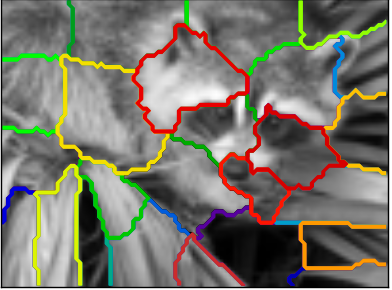

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации.

Проверим их на ```duck.jpg``` и ```owls.jpg```

### **Задание 5 (0.2 балла)**

Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

In [28]:
from pathlib import Path
bdir = Path('.')

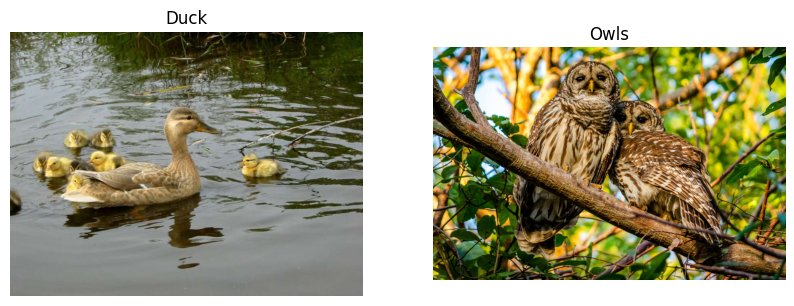

In [29]:
from PIL import Image
from pathlib import Path

bdir = Path('.')

duck_image = Image.open(bdir.joinpath('duck.jpg').absolute().__str__())
owls_image = Image.open(bdir.joinpath('Owls.jpg').absolute().__str__())

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(duck_image)
plt.title("Duck")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(owls_image)
plt.title("Owls")
plt.axis('off')

plt.show()

### **Задание 6 (0.8 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

- Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :))
- Проанализируйте результат

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [30]:
import numpy as np
from sklearn.cluster import KMeans


def find_components(image, lmbd, n_clusters):

    pixels = np.array(image)
    height, width, channels = pixels.shape

    X = []
    for y in range(height):
        for x in range(width):
            r, g, b = pixels[y, x]
            psi = [lmbd * x, lmbd * y, r, g, b]
            X.append(psi)
    X = np.array(X)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(X)

    clustered_image = labels.reshape(height, width)

    return clustered_image

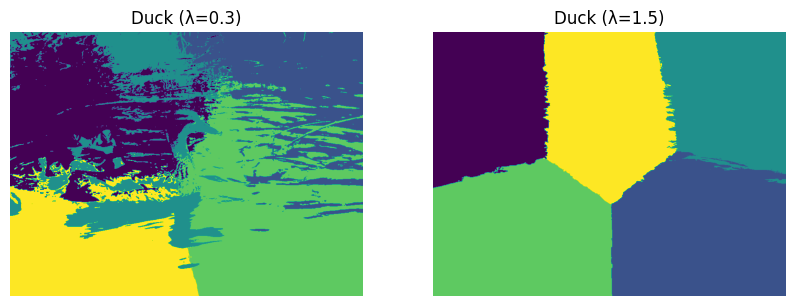

In [31]:
plt.figure(figsize=(10, 10))

lmbd_duck_03 = 0.3
lmbd_duck_15 = 1.5
n_clusters_duck = 5

clustered_duck_03 = find_components(duck_image, lmbd_duck_03, n_clusters_duck)
clustered_duck_15 = find_components(duck_image, lmbd_duck_15, n_clusters_duck)

plt.subplot(1, 2, 1)
plt.imshow(clustered_duck_03, cmap='viridis')
plt.title(f"Duck (λ={lmbd_duck_03})")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(clustered_duck_15, cmap='viridis')
plt.title(f"Duck (λ={lmbd_duck_15})")
plt.axis('off')

plt.show()

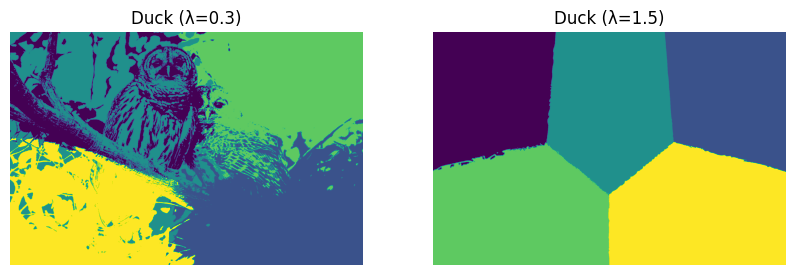

In [32]:
plt.figure(figsize=(10, 10))

lmbd_owls_03 = 0.3
lmbd_owls_15 = 1.5
n_clusters_owls = 5

clustered_owls_03 = find_components(owls_image, lmbd_owls_03, n_clusters_owls)
clustered_owls_15 = find_components(owls_image, lmbd_owls_15, n_clusters_owls)

plt.subplot(1, 2, 1)
plt.imshow(clustered_owls_03, cmap='viridis')
plt.title(f"Duck (λ={lmbd_owls_03})")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(clustered_owls_15, cmap='viridis')
plt.title(f"Duck (λ={lmbd_owls_15})")
plt.axis('off')

plt.show()

при низких λ кластеры выделяются по близкости цвета, при увеличении λ, акцент меняется на пространственное расположение.  
Так при (λ=0.3) кластеры выделяются по цвету, и могу распологаться внутри других кластеров, а при (λ=1.5) видно четкое пространственное разделение, бее включений

### **Задание 7 (0.8 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [88]:
from skimage import color, transform
from sklearn.cluster import spectral_clustering
from sklearn.feature_extraction import image

def prepare_image(img, scale_factor=0.5):
    img_gray = color.rgb2gray(img)
    img_resized = transform.rescale(img_gray, scale_factor)
    return img_resized

def spectral_segmentation(im, n_clusters, beta=5, eps=1e-6, assign_labels='kmeans'):
    graph = image.img_to_graph(im)
    graph.data = np.exp(-beta * graph.data / im.std()) + eps
    labels = spectral_clustering(graph, n_clusters=n_clusters, assign_labels=assign_labels, random_state=42)
    labels = labels.reshape(im.shape)
    return labels

### **Задание 8 (0.2 балла)**
- Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.
- Проанализируйте сравнение

Кластеризация из предидущего дазания выделяет по цветовой гамме кластеры, и объеденяет наиболее близкие по по цвету кластеры. Также не выделяет элементы, если они не обладают контрастностью. Спектральная кластеризация выделяет некоторые гранциы (контуры) объектов, на основании графа. Если стоит задача сегминтации обхектов, то спектральная кластерицация должна проявлять себя сильно лучше. Однако её стоимость вычислительная в разы выше. 

In [89]:
def visualize_segmentation(image, labels, n_clusters):
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap=plt.cm.gray)
    for l in range(n_clusters):
        plt.contour(labels == l, contours=1, colors=[plt.cm.nipy_spectral(l / float(n_clusters)), ])
    plt.xticks(())
    plt.yticks(())
    plt.title('Spectral Clustering Segmentation')
    plt.show()

/tmp/ipykernel_8510/3298829282.py:5: UserWarning:

The following kwargs were not used by contour: 'contours'



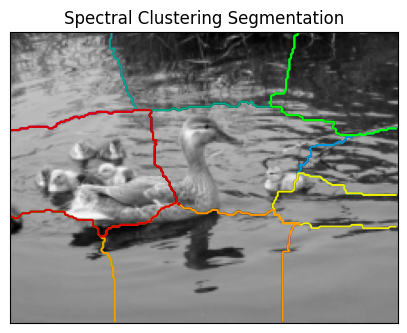

In [93]:
prep_duck = prepare_image(duck_image, scale_factor=0.25)
labels = spectral_segmentation(prep_duck, 10, assign_labels='kmeans')
visualize_segmentation(prep_duck, labels, 10)

/tmp/ipykernel_8510/3298829282.py:5: UserWarning:

The following kwargs were not used by contour: 'contours'



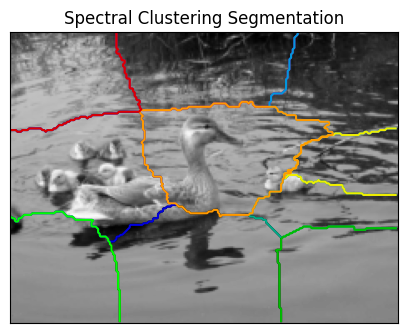

In [94]:
prep_duck = prepare_image(duck_image, scale_factor=0.25)
labels = spectral_segmentation(prep_duck, 10, assign_labels='discretize')
visualize_segmentation(prep_duck, labels, 10)

/tmp/ipykernel_8510/3298829282.py:5: UserWarning:

The following kwargs were not used by contour: 'contours'



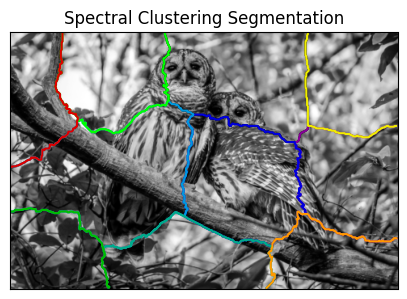

In [95]:
prep_owls = prepare_image(owls_image, scale_factor=0.25)
labels = spectral_segmentation(prep_owls, 10, assign_labels='kmeans')
visualize_segmentation(prep_owls, labels, 10)

/tmp/ipykernel_8510/3298829282.py:5: UserWarning:

The following kwargs were not used by contour: 'contours'



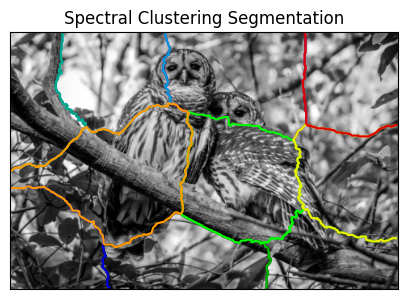

In [96]:
prep_owls = prepare_image(owls_image, scale_factor=0.25)
labels = spectral_segmentation(prep_owls, 10, assign_labels='discretize')
visualize_segmentation(prep_owls, labels, 10)

### **Задание 9 (1 балл)**

- Найдите интересную картинку милого животного и примените алгоритмы и к ней. Поэкспериментируйте с параметрами алгоритмов и постарайтесь добиться оптимального результата. Картинку нужно будет загрузить вместе с работой.

- Сравните два подхода и сегментации, к которым они приводят. Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

**Примечание:**

Слишком большие лучше не брать - считаться будет долго. Не забудьте визуализировать!


In [97]:
bars_image = Image.open(bdir.joinpath('bars.jpg').absolute().__str__())

/tmp/ipykernel_8510/3298829282.py:5: UserWarning:

The following kwargs were not used by contour: 'contours'



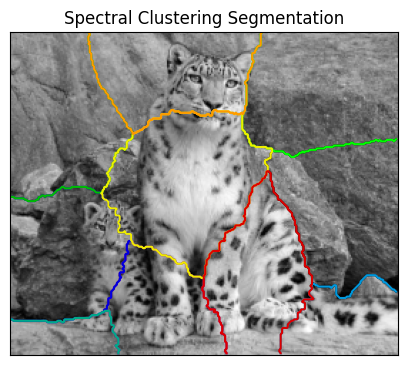

In [98]:
prep_bars = prepare_image(bars_image, scale_factor=0.5)
labels = spectral_segmentation(prep_bars, 10, assign_labels='discretize')
visualize_segmentation(prep_bars, labels, 10)

/tmp/ipykernel_8510/3298829282.py:5: UserWarning:

The following kwargs were not used by contour: 'contours'



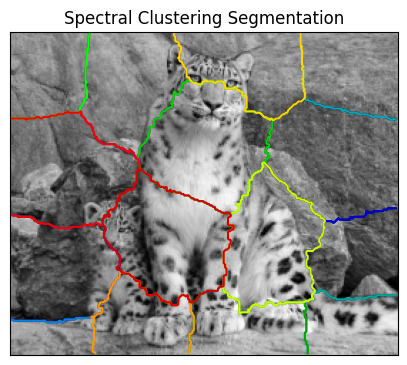

In [99]:
prep_bars = prepare_image(bars_image, scale_factor=0.5)
labels = spectral_segmentation(prep_bars, 15, assign_labels='discretize')
visualize_segmentation(prep_bars, labels, 15)

In [ ]:
prep_bars = prepare_image(bars_image, scale_factor=1.0)
labels = spectral_segmentation(prep_bars, 10, assign_labels='discretize')
visualize_segmentation(prep_bars, labels, 10)

**Ваш ответ здесь**

## **Бонус (1 балл)**

В качестве бонуса предлагаем вам построить алгоритм кластеризации типов движения на наборе Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

### **Задание 1 (0.05 балла)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [12]:
from pathlib import Path

In [32]:
def read_txt_to_csv(path):
    with open(path) as file:
        data = file.readlines()
    data = [i.strip().split() for i in data]
    return pd.DataFrame(data, columns=[f'_{i}' for i in range(len(data[0]))])

In [33]:
work_dir = Path('.')

In [34]:
X_test = read_txt_to_csv(work_dir.joinpath('samsung/samsung_test.txt').absolute().__str__()).astype(float)
X_train = read_txt_to_csv(work_dir.joinpath('samsung/samsung_train.txt').absolute().__str__()).astype(float)

y_test = read_txt_to_csv(work_dir.joinpath('samsung/samsung_test_labels.txt').absolute().__str__()).astype(float)
y_train = read_txt_to_csv(work_dir.joinpath('samsung/samsung_train_labels.txt').absolute().__str__()).astype(float)

In [ ]:
X = pd.concat([X_train, X_test]).values
y = pd.concat([y_train, y_test]).values

In [37]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

array([1., 2., 3., 4., 5., 6.])

### **Задание 2 (0.05 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [38]:
# Ваш код здесь
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### **Задание 3 (0.15 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мспользуем методы **понижения размерности**. В частности, мы будем использовать метод главных компонент. Если вы проходили степик, то знакомы с ним, если нет, то почитать про PCA вам нужно в [Конспекте](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture12-factorizations.pdf).

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма массива pca.explained_variance_ratio_ должна быть больше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [39]:
from sklearn.decomposition import PCA

RANDOM_STATE = 42

pca = PCA(n_components=0.9, random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_scaled)

In [41]:
X_pca.shape

(10299, 65)

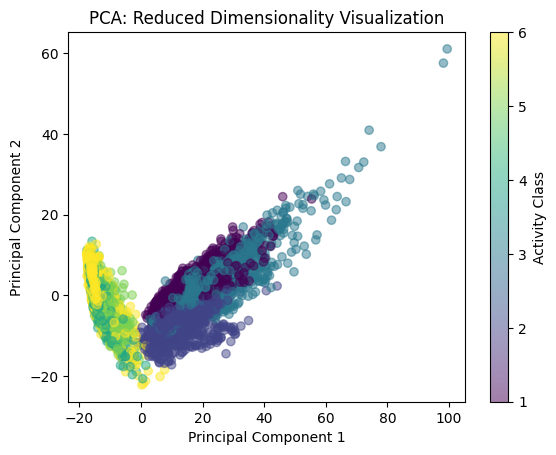

In [42]:
import matplotlib.pyplot as plt

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', alpha=0.5)
plt.title('PCA: Reduced Dimensionality Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Activity Class')
plt.show()

### **Задание 4. (0.15 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [43]:
from sklearn.cluster import KMeans
import time

n_clusters = 6
n_init = 100

# Обучение модели
start_time = time.time()
kmeans = KMeans(n_clusters=n_clusters, n_init=n_init, random_state=RANDOM_STATE)
kmeans.fit(X_pca)
training_time = time.time() - start_time

# Инференс
start_time = time.time()
labels = kmeans.predict(X_pca)
inference_time = time.time() - start_time

print(f"Training time: {training_time:.4f} seconds")
print(f"Inference time: {inference_time:.4f} seconds")

Training time: 6.8605 seconds
Inference time: 0.0019 seconds


### **Задание 6 (0.05 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

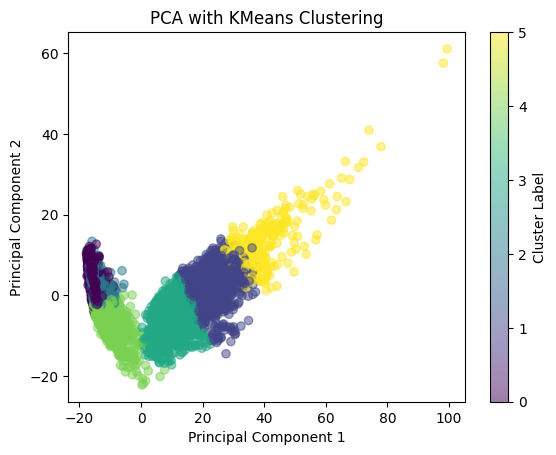

In [44]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.5)
plt.title('PCA with KMeans Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

### **Задание 7 (0.1 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [45]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari_score = adjusted_rand_score(y.flatten(), labels)
nmi_score = normalized_mutual_info_score(y.flatten(), labels)

print(f"Adjusted Rand Index (ARI): {ari_score:.4f}")
print(f"Normalized Mutual Information (NMI): {nmi_score:.4f}")

Adjusted Rand Index (ARI): 0.4195
Normalized Mutual Information (NMI): 0.5600


ARI измеряет сходство между истинными и предсказанными кластерами, учитывая случайное совпадение.  
NMI измеряет взаимную информацию между истинными и предсказанными кластерами, нормализованную на их энтропии.  

Вывод: Обе метрики показывают, насколько хорошо кластеризация соответствует истинным классам. 
Чем ближе значения к 1, тем лучше качество кластеризации.

### **Задание 8 (0.15 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

Training time: 3.2524 seconds
Inference time: 3.4912 seconds


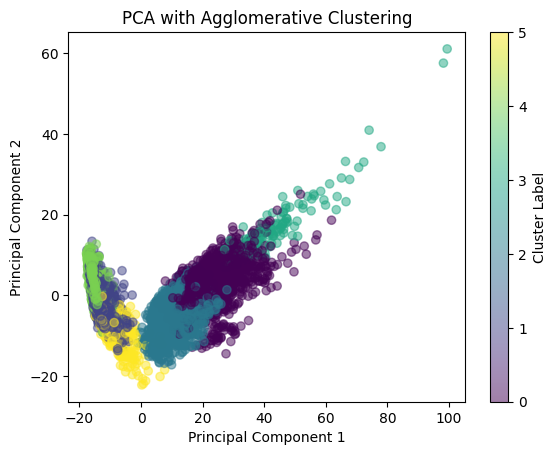

In [46]:
from sklearn.cluster import AgglomerativeClustering


start_time = time.time()
agglo = AgglomerativeClustering(n_clusters=n_clusters)
agglo_labels = agglo.fit_predict(X_pca)
training_time = time.time() - start_time

start_time = time.time()
agglo_labels = agglo.fit_predict(X_pca)
inference_time = time.time() - start_time

print(f"Training time: {training_time:.4f} seconds")
print(f"Inference time: {inference_time:.4f} seconds")

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=agglo_labels, cmap='viridis', alpha=0.5)
plt.title('PCA with Agglomerative Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

In [49]:
ari_score_agglo = adjusted_rand_score(y.flatten(), agglo_labels)
nmi_score_agglo = normalized_mutual_info_score(y.flatten(), agglo_labels)

print(f"KMeans ARI: {ari_score:.4f}, AgglomerativeClustering ARI: {ari_score_agglo:.4f}")
print(f"KMeans NMI: {nmi_score:.4f}, AgglomerativeClustering NMI: {nmi_score_agglo:.4f}")

KMeans ARI: 0.4195, AgglomerativeClustering ARI: 0.4936
KMeans NMI: 0.5600, AgglomerativeClustering NMI: 0.6218


Стало лучше.  
AgglomerativeClustering использует иерархический подход, учитавется и структура данных. Подходил для смешанных или сложных кластеров лучше чем KMeans.
Но она работает сильно дольше на больших наборах данных. Для нашей задачи это приемлемо, но если бы сеты был 1000 раз больше, ощутилось бы.

### **Задание 9 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

1) Да, объекты внутри каждого кластера в целом соответствуют определенному типу активности. Можно визуально выделить кластеры. Что соответствует метрикам.  
2) Смешиваются кластеры, которые физически близки. Например походил + подъем по лестнице и т.п. т.к. активности которые находятся в близких генеральных паттренах обычного дня человека.  
3) Визуально кластеры различимы. Смешивание все же присутствует. Также метрики достаточно отражают более менее нормальные значения. Но полного разделения у меня не получисло. Улучшить можно. Увеличить дисперсию при pca, взять другие алгоритмы и т.п.

**Вы ещё здесь!** или **уже**?)

Спасибо за труд! Котобонус:

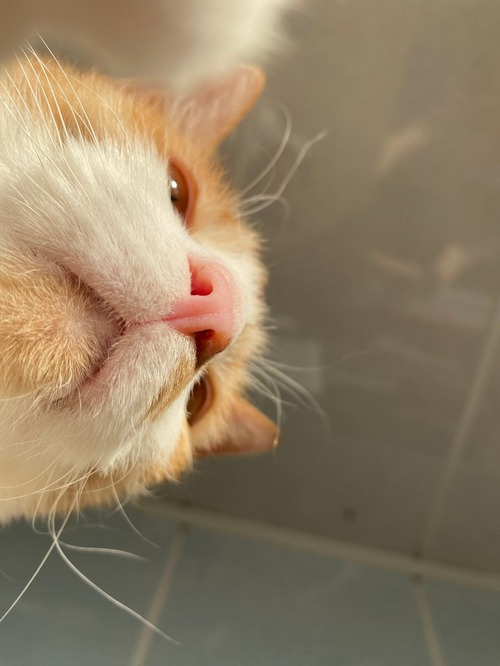